In [1]:
#pip install dataprep
#pip install folium
#pip install plotly
#pip install missingno

In [49]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
%matplotlib inline
import missingno as msno

In [50]:
df = pd.read_csv('//Users//omniaelmenshawy//Desktop///CC GENERAL.csv')
df.head(5)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [52]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
ONEOFF_PURCHASES,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
INSTALLMENTS_PURCHASES,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
CASH_ADVANCE,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


In [53]:
df.shape

(8950, 18)

# EDA & Preprocessing:
- Report
- Missing values
- Duplicated values
- Outliers
- Dimensionallity Reduction

In [54]:
from dataprep.eda import create_report
report = create_report(df, title='My Report')

  0%|                                                  | 0/3624 [00:00<?, ?it/s]

My Report
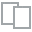
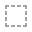
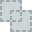
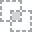
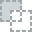
...
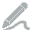
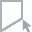
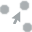
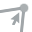
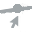

In [55]:
report

In [56]:
def get_null_count(df):
    for i in df.columns:
        print(i,': ',len(df[df[i].isnull()][i]))
get_null_count(df)

CUST_ID :  0
BALANCE :  0
BALANCE_FREQUENCY :  0
PURCHASES :  0
ONEOFF_PURCHASES :  0
INSTALLMENTS_PURCHASES :  0
CASH_ADVANCE :  0
PURCHASES_FREQUENCY :  0
ONEOFF_PURCHASES_FREQUENCY :  0
PURCHASES_INSTALLMENTS_FREQUENCY :  0
CASH_ADVANCE_FREQUENCY :  0
CASH_ADVANCE_TRX :  0
PURCHASES_TRX :  0
CREDIT_LIMIT :  1
PAYMENTS :  0
MINIMUM_PAYMENTS :  313
PRC_FULL_PAYMENT :  0
TENURE :  0


###  - Since the Minimum_Payments Column has outliers, the median would be a good estimatiot for the null vaues.
### - Dropping the missing value in the Credit_Limit column as it weights only 0.01 of the column values.
### - Dropping the ID column as it is not relative

In [57]:
df.loc[(df['MINIMUM_PAYMENTS'].isnull()==True),
       'MINIMUM_PAYMENTS']= df['MINIMUM_PAYMENTS'].median()

In [58]:
df.dropna(subset=['CREDIT_LIMIT'], inplace=True)

In [59]:
df.drop(['CUST_ID'], axis=1, inplace=True)

In [60]:
df.shape

(8949, 17)

# Skewness

<AxesSubplot:>

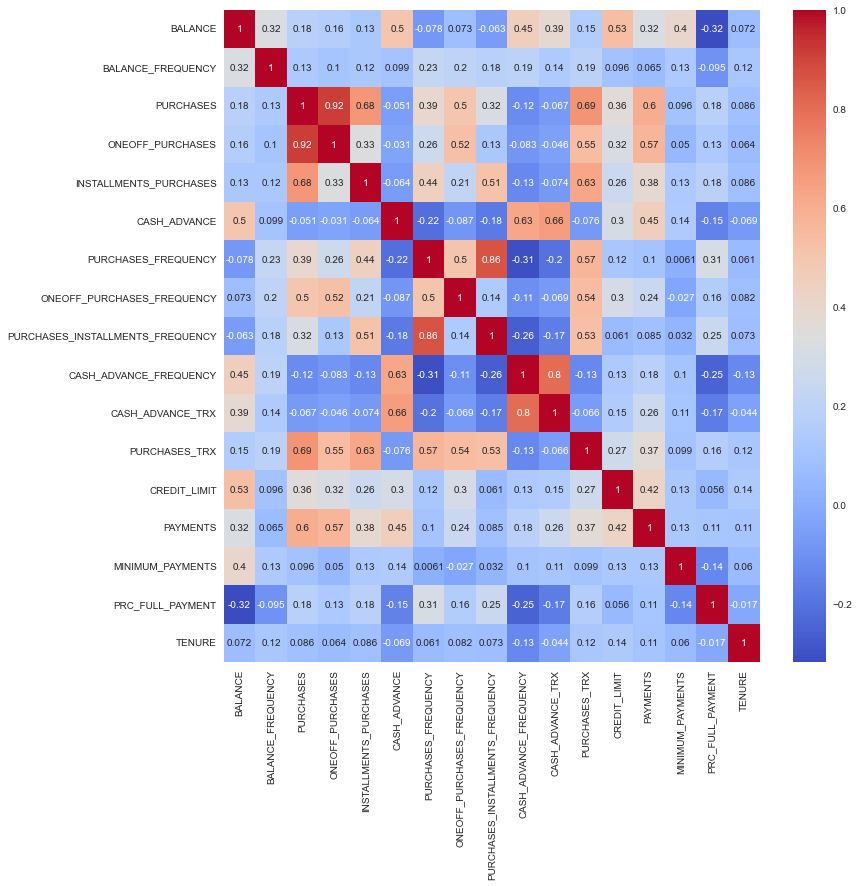

In [62]:
plt.figure(figsize=(12,12))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')

/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-l

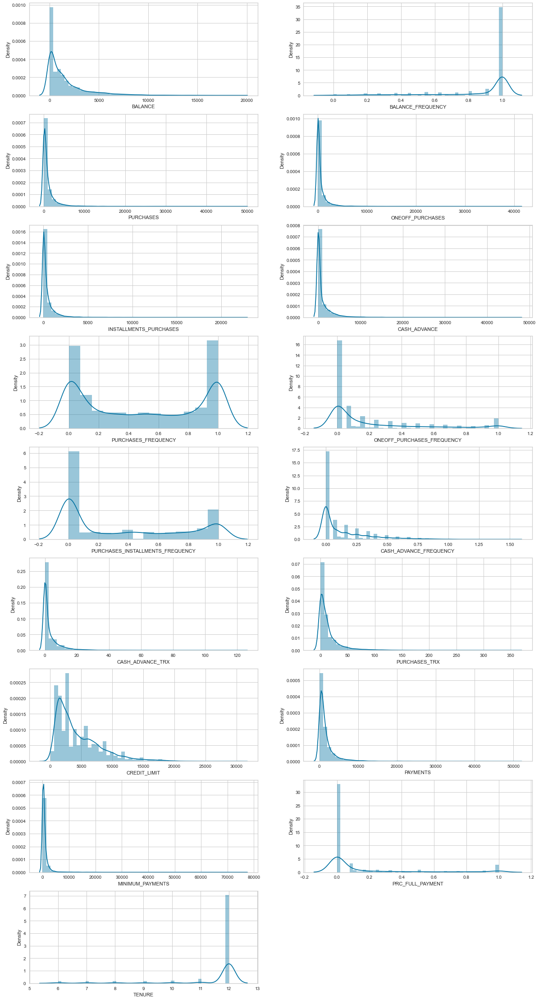

In [61]:
i=1
plt.figure(figsize= (20,40))
for col in df.columns:
    plt.subplot(9,2,i)
        
    sns.distplot(df[col])
    
    i=i+1
plt.show()

In [63]:
for col in df.columns:
    print(col)
    print({df[col].skew()})

BALANCE
{2.393270481328754}
BALANCE_FREQUENCY
{-2.0241932378008083}
PURCHASES
{8.143969328745825}
ONEOFF_PURCHASES
{10.044621791824193}
INSTALLMENTS_PURCHASES
{7.298823158100543}
CASH_ADVANCE
{5.1663234455291605}
PURCHASES_FREQUENCY
{0.0599701177816327}
ONEOFF_PURCHASES_FREQUENCY
{1.5354529638777794}
PURCHASES_INSTALLMENTS_FREQUENCY
{0.5090232211948914}
CASH_ADVANCE_FREQUENCY
{1.8286441199006067}
CASH_ADVANCE_TRX
{5.72097632533681}
PURCHASES_TRX
{4.6304932272467205}
CREDIT_LIMIT
{1.5224640052886198}
PAYMENTS
{5.90746501386916}
MINIMUM_PAYMENTS
{13.851852833613735}
PRC_FULL_PAYMENT
{1.9426413977925}
TENURE
{-2.9447877484535407}


/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-l

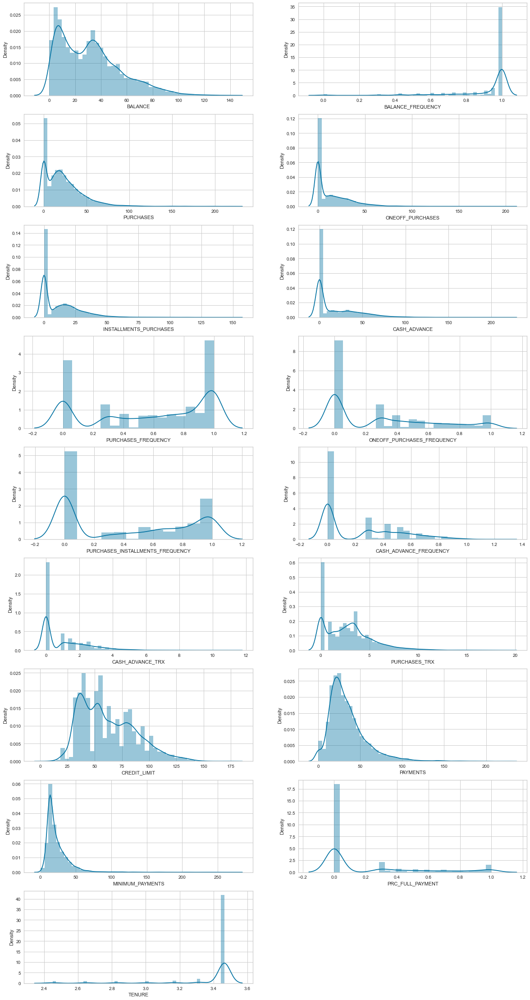

In [64]:
i=1
plt.figure(figsize=(20,40))
for col in df.columns:
    plt.subplot(9,2,i)
    df[col]= np.sqrt(df[col])
    sns.distplot(df[col])
    i=i+1
    
plt.show()

## Handelling Outliers:


In [65]:
def outlier_percent(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    minimum = Q1 - (1.5 * IQR)
    maximum = Q3 + (1.5 * IQR)
    num_outliers =  np.sum((data < minimum) |(data > maximum))
    num_total = data.count()
    return (num_outliers/num_total)*100

In [66]:

for column in df.columns:
    data = df[column]
    percent = str(round(outlier_percent(data), 2))
    print(f'Outliers in "{column}": {percent}%')

Outliers in "BALANCE": 1.05%
Outliers in "BALANCE_FREQUENCY": 19.16%
Outliers in "PURCHASES": 2.67%
Outliers in "ONEOFF_PURCHASES": 2.99%
Outliers in "INSTALLMENTS_PURCHASES": 1.8%
Outliers in "CASH_ADVANCE": 2.25%
Outliers in "PURCHASES_FREQUENCY": 0.0%
Outliers in "ONEOFF_PURCHASES_FREQUENCY": 0.0%
Outliers in "PURCHASES_INSTALLMENTS_FREQUENCY": 0.0%
Outliers in "CASH_ADVANCE_FREQUENCY": 0.01%
Outliers in "CASH_ADVANCE_TRX": 1.56%
Outliers in "PURCHASES_TRX": 2.88%
Outliers in "CREDIT_LIMIT": 0.15%
Outliers in "PAYMENTS": 4.65%
Outliers in "MINIMUM_PAYMENTS": 5.58%
Outliers in "PRC_FULL_PAYMENT": 6.7%
Outliers in "TENURE": 15.25%


In [67]:
from sklearn.impute import KNNImputer
for column in df.columns:
    data = df[column]
    
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    minimum = Q1 - (1.5 * IQR)
    maximum = Q3 + (1.5 * IQR)
 
    outliers = ((data < minimum) |(data > maximum))
    df[column].loc[outliers] = np.nan
    
df.isna().sum()

BALANCE                               94
BALANCE_FREQUENCY                   1715
PURCHASES                            239
ONEOFF_PURCHASES                     268
INSTALLMENTS_PURCHASES               161
CASH_ADVANCE                         201
PURCHASES_FREQUENCY                    0
ONEOFF_PURCHASES_FREQUENCY             0
PURCHASES_INSTALLMENTS_FREQUENCY       0
CASH_ADVANCE_FREQUENCY                 1
CASH_ADVANCE_TRX                     140
PURCHASES_TRX                        258
CREDIT_LIMIT                          13
PAYMENTS                             416
MINIMUM_PAYMENTS                     499
PRC_FULL_PAYMENT                     600
TENURE                              1365
dtype: int64

In [68]:
imputer = KNNImputer()
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df.isna().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

## Standarization:

In [69]:
from sklearn.preprocessing import RobustScaler
Scalled_df = pd.DataFrame(RobustScaler().fit_transform(df), columns=df.columns)

In [70]:
Scalled_df.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8949.0,0.053852,0.664781,-0.870053,-0.536554,0.0,0.463446,1.963410
BALANCE_FREQUENCY,8949.0,-1.246942,2.489187,-13.053703,-1.000000,0.0,0.000000,0.000000
PURCHASES,8949.0,0.097830,0.687667,-0.708361,-0.475211,0.0,0.524789,2.046993
ONEOFF_PURCHASES,8949.0,0.284465,0.671544,-0.263438,-0.263438,0.0,0.736562,2.316361
INSTALLMENTS_PURCHASES,8949.0,0.134183,0.633771,-0.438998,-0.438998,0.0,0.561002,2.087282
CASH_ADVANCE,8949.0,0.523616,0.676059,0.000000,0.000000,0.0,1.000000,2.561309
PURCHASES_FREQUENCY,8949.0,-0.183905,0.577640,-1.057352,-0.625690,0.0,0.374310,0.437969
ONEOFF_PURCHASES_FREQUENCY,8949.0,0.016356,0.616192,-0.527045,-0.527045,0.0,0.472955,1.298697
PURCHASES_INSTALLMENTS_FREQUENCY,8949.0,0.031131,0.483171,-0.471405,-0.471405,0.0,0.528595,0.683296
CASH_ADVANCE_FREQUENCY,8949.0,0.508758,0.590569,0.000000,0.000000,0.0,1.000000,2.371709


## PCA:

In [71]:
from sklearn.decomposition import PCA 
pca = PCA(n_components=0.9, random_state=42)
pca.fit(Scalled_df)
PC_names = ['PC'+str(x) for x in range(1,len(pca.components_)+1)]
PCA_df = pd.DataFrame(pca.transform(df), columns=PC_names)

<AxesSubplot:>

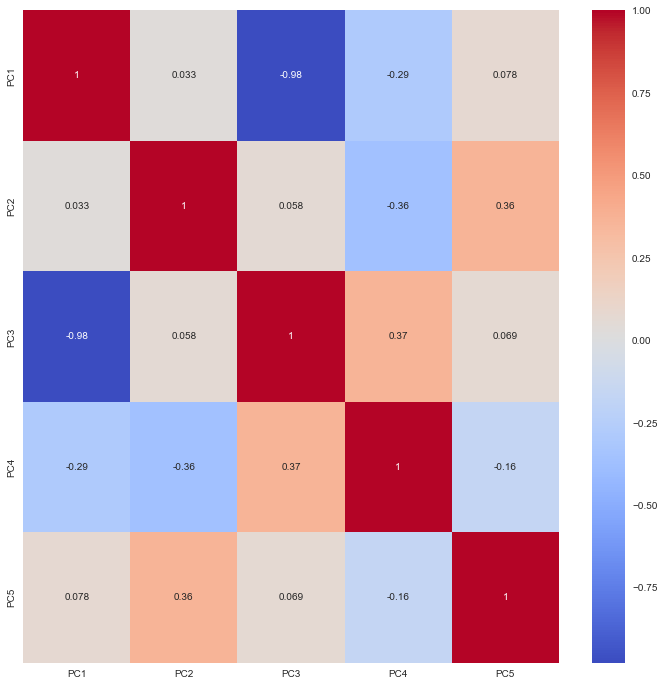

In [72]:
plt.figure(figsize=(12,12))
sns.heatmap(PCA_df.corr(), annot=True, cmap='coolwarm')

## Modeling:

In [73]:
#! pip install yellowbrick

In [74]:
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

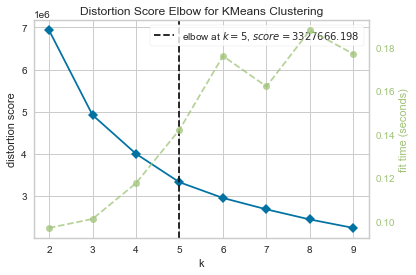

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [75]:
model = KMeans(random_state=42)
distortion_visualizer = KElbowVisualizer(model, k=(2,10))

distortion_visualizer.fit(PCA_df)       
distortion_visualizer.show()       

In [76]:
km_model = KMeans(distortion_visualizer.elbow_value_, random_state=42)
labels = km_model.fit_predict(PCA_df)

In [78]:
df['LABELS'] = labels
Scalled_df['LABELS'] = labels
PCA_df['LABELS'] = labels

<AxesSubplot:ylabel='LABELS'>

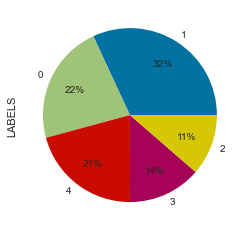

In [79]:
PCA_df.LABELS.value_counts().plot.pie(autopct='%1.0f%%',
                                        pctdistance=0.7, labeldistance=1.1)

# Model Evaluation:


- The Davis-Bouldin Index 
- The Silhouette Coefficient



In [80]:
print(f'Davies-Bouldin index = {davies_bouldin_score(PCA_df, labels)}')
print(f'Silhouette Score = {silhouette_score(PCA_df, labels)}')


Davies-Bouldin index = 1.0132026886468997
Silhouette Score = 0.3176468758840334


/Users/omniaelmenshawy/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


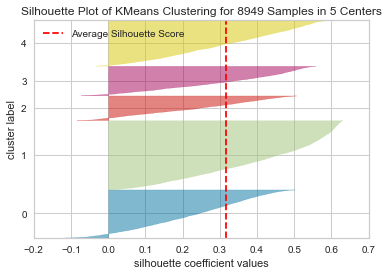

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 8949 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [81]:
visualizer = SilhouetteVisualizer(km_model, colors='yellowbrick')
visualizer.fit(PCA_df.drop(['LABELS'],axis=1))
visualizer.show()

In [82]:
pca= PCA(n_components=2)
X2= pca.fit_transform(df)

In [83]:
pca_df = pd.DataFrame(data=X2, columns=['pca1','pca2'])
pca_df['labels']= labels
pca_df.head()

,pca1,pca2,labels
0,-50.094847,-5.576579,1
1,56.284360,-52.289804,3
2,19.940213,13.391631,0
3,14.138240,15.075385,0
4,-32.150144,-13.982751,1


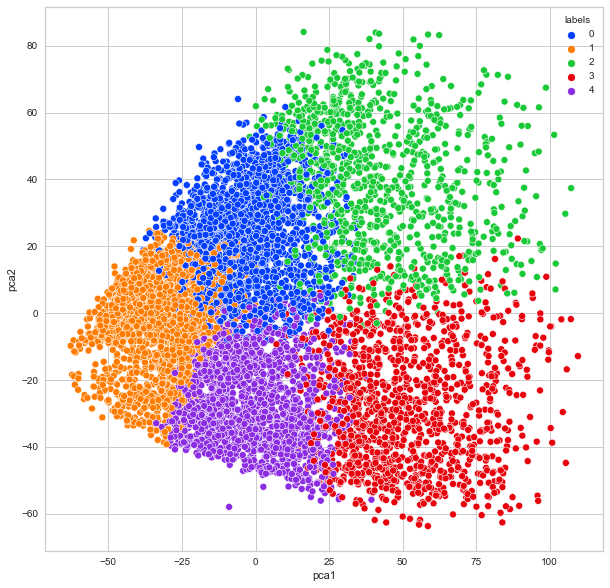

In [84]:
plt.figure(figsize=(10,10))
ax = sns.scatterplot(x='pca1', y='pca2', hue='labels', data=pca_df, palette='bright')